# Regresión Logística

Es un algoritmo supervizado, usado para la clasificación, busca dar un valor binario para que separe los datos de acuerdo a sus características.

Se usa la función sigmoide, que va desde 0 a 1 y retorna la probabilidad de pertenecer a una clase a otra, por lo que es ideal para una claficicación binaria. Su fórmula es: $$p=\frac{1}{1+e^{-(x)}}$$

Por ejemplo:

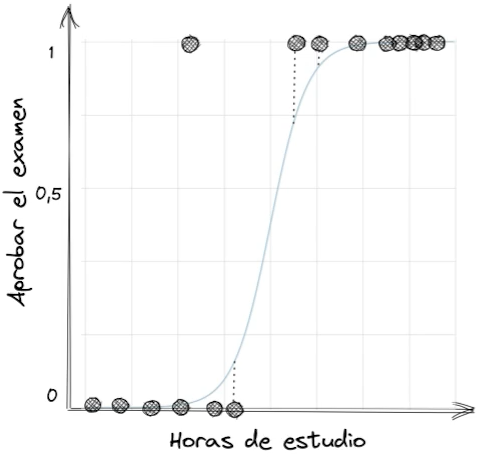

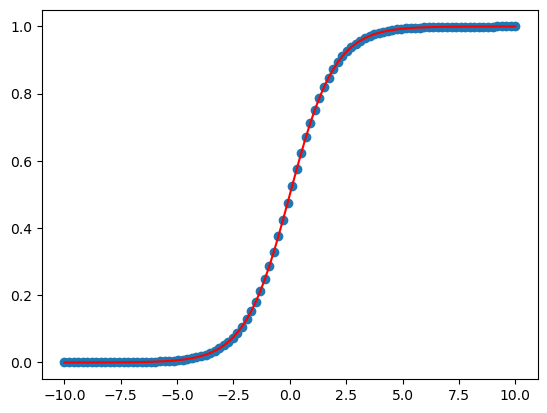

In [362]:

import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x):
    return 1/(1+np.exp(-x))

x = np.linspace(-10, 10, 100)
y = sigmoid(x)
plt.scatter(x, y)
plt.plot(x, y, c="r", linewidth=1.5)
plt.show()

## Odds

Son una forma de expresar la probabilidad de que ocurra un evento. En particular, los "odds" representan la relación entre la probabilidad de que ocurra un evento y la probabilidad de que no ocurra.

Es el ratio de un evento sobre otro, en este ejemplo significa que es 4 veces más probable que ocurra el evento exitoso

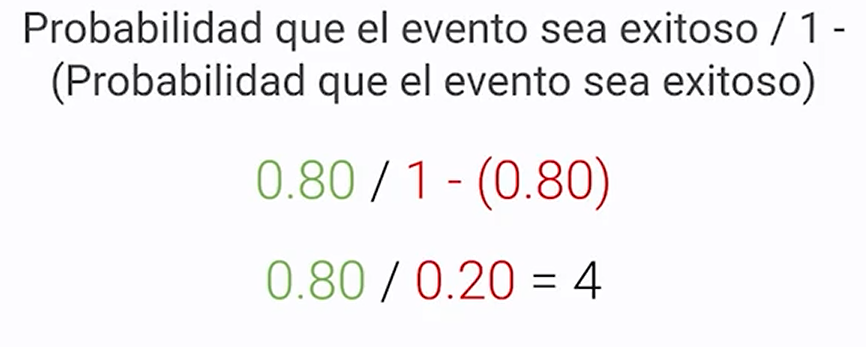

Se le agrega el logaritmo para crear un Log odds, para manejar mejor los infinitos para hacerlo simétrico alrededor de 0.

$$p=\frac{1}{1+e^{-\log{(\frac{p}{1-p})}}}$$

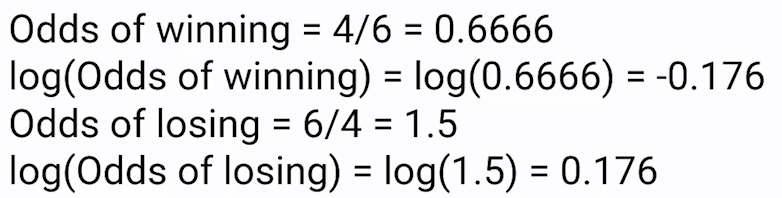

La probabilidad se puede reescribir como una regresión lineal, por eso el nombre del algoritmo.
$$\frac{P}{1-P}=\beta_o+\beta_1X$$
$$\log(\frac{P}{1-P})=\beta_o+\beta_1X$$

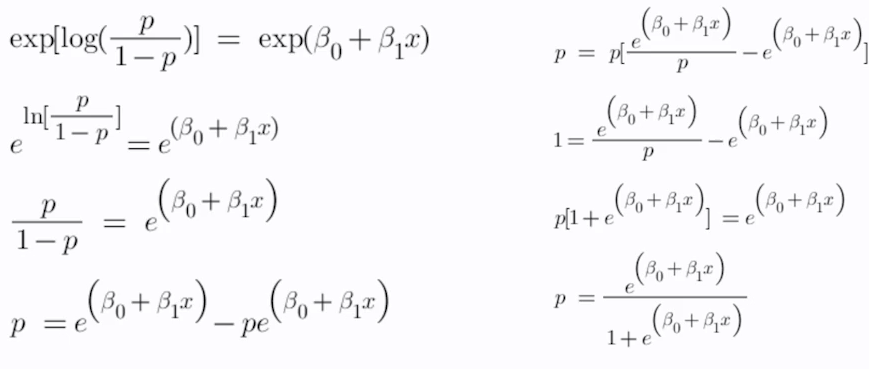

Al final nos queda que:$$p=\frac{1}{1+e^{-(\beta_o+\beta_1X)}}$$

## ¿Cuandó utilizarlo?

Se desea usar cuando se busca obtener las probabilidades sobre un evento categórico, cuando el dataset es linealmente separable y cuando tenemos datasets grandes y balanceados

|Ventajas   |Desventajas   |
|---|---|
|Fácil de implementar   |Asume linealidad entre las variables dependientes   |
|Coeficientes interpretables   |Overfitting sobre datasets de alta dimensionalidad   |
|Inferencia de la importancia de cada característica   |Le afecta la multicolinealidad de variables   |
|Clasificación en porcentajes (De 1 a 0)  |Mejores resultados con datasets grandes   |
|Excelentes resultados con datasets linealmente separables   |   |


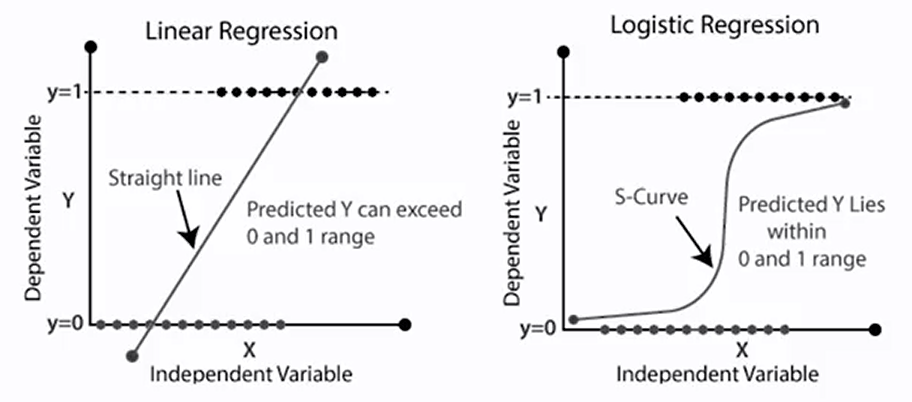


## ¿Cómo se evalúa el modelo?
**Maximum verosimilitud (MLE)** Entre más alto sea el número, mejor se ajusta el modelo

**Descenso del gradiante** Busca optimizar la función de coste, se hacen derivadas parciales en la función para hallar el punto más bajo de la función de coste para encontrar las predicciones más optimas

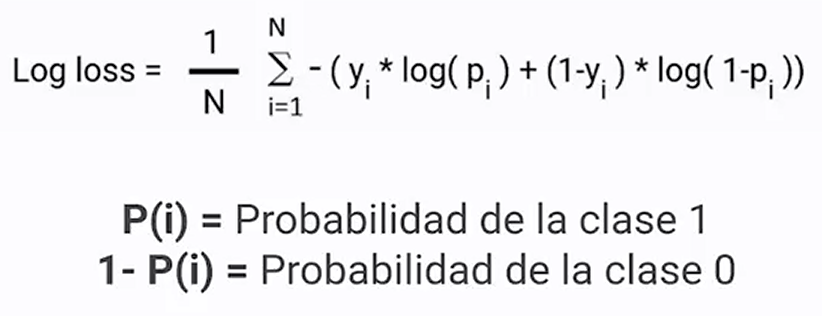

## Regularizers

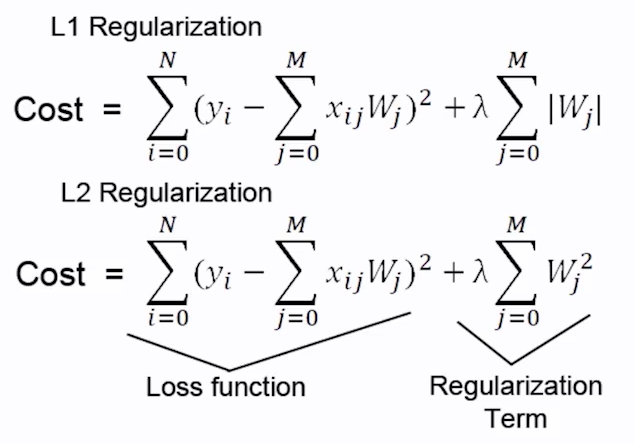

## Solvers

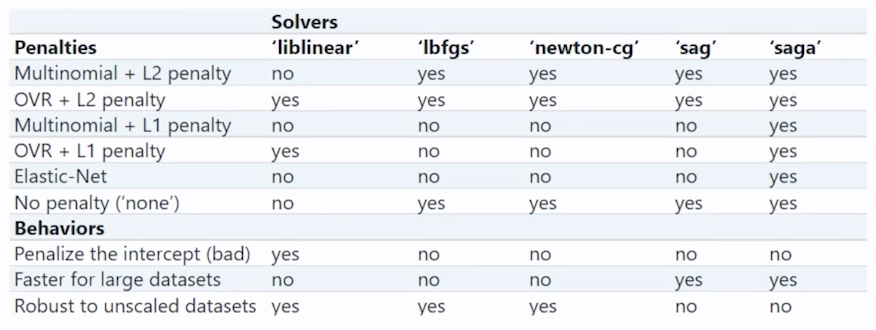

## Aplicación

### Importando librerías

In [363]:
from sklearn.datasets import load_digits
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LogisticRegression

In [364]:
import warnings

warnings.filterwarnings('ignore')

### Cargar datos

In [365]:
digits = load_digits()
digits.data[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

In [366]:
img = np.reshape(digits.data[0], (8, 8))
img

array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.],
       [ 0.,  0., 13., 15., 10., 15.,  5.,  0.],
       [ 0.,  3., 15.,  2.,  0., 11.,  8.,  0.],
       [ 0.,  4., 12.,  0.,  0.,  8.,  8.,  0.],
       [ 0.,  5.,  8.,  0.,  0.,  9.,  8.,  0.],
       [ 0.,  4., 11.,  0.,  1., 12.,  7.,  0.],
       [ 0.,  2., 14.,  5., 10., 12.,  0.,  0.],
       [ 0.,  0.,  6., 13., 10.,  0.,  0.,  0.]])

In [367]:
set(digits.target)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}

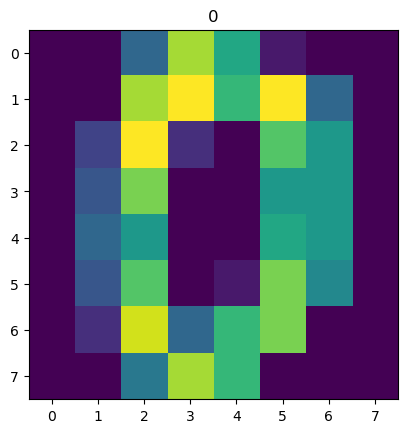

In [368]:
plt.imshow(img)
plt.title(digits.target[0])
plt.show()

#### Split de datos

In [369]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target, test_size=0.2, random_state=0)

In [370]:
print(f"""X_train: {X_train.shape} \n
y_train: {y_train.shape} \n
X_test: {X_test.shape} \n
y_test: {y_test.shape} \n""")

X_train: (1437, 64) 

y_train: (1437,) 

X_test: (360, 64) 

y_test: (360,) 



### Creando modelo

In [371]:
logistic_reg = LogisticRegression()
logistic_reg.fit(X_train, y_train)

LogisticRegression()

### Evaluando modelo

In [372]:
y_pred = logistic_reg.predict(X_test)
y_pred

array([2, 8, 2, 6, 6, 7, 1, 9, 8, 5, 2, 8, 6, 6, 6, 6, 1, 0, 5, 8, 8, 7,
       8, 4, 7, 5, 4, 9, 2, 9, 4, 7, 6, 8, 9, 4, 3, 1, 0, 1, 8, 6, 7, 7,
       1, 0, 7, 6, 2, 1, 9, 6, 7, 9, 0, 0, 9, 1, 6, 3, 0, 2, 3, 4, 1, 9,
       2, 6, 9, 1, 8, 3, 5, 1, 2, 8, 2, 2, 9, 7, 2, 3, 6, 0, 9, 3, 7, 5,
       1, 2, 9, 9, 3, 1, 4, 7, 4, 8, 5, 8, 5, 5, 2, 5, 9, 0, 7, 1, 4, 7,
       3, 4, 8, 9, 7, 9, 8, 2, 1, 5, 2, 5, 8, 4, 1, 7, 0, 6, 1, 5, 5, 9,
       9, 5, 9, 9, 5, 7, 5, 6, 2, 8, 6, 9, 6, 1, 5, 1, 5, 9, 9, 1, 5, 3,
       6, 1, 8, 9, 8, 7, 6, 7, 6, 5, 6, 0, 8, 8, 9, 8, 6, 1, 0, 4, 1, 6,
       3, 8, 6, 7, 4, 9, 6, 3, 0, 3, 3, 3, 0, 7, 7, 5, 7, 8, 0, 7, 1, 9,
       6, 4, 5, 0, 1, 4, 6, 4, 3, 3, 0, 9, 5, 9, 2, 1, 4, 2, 1, 6, 8, 9,
       2, 4, 9, 3, 7, 6, 2, 3, 3, 1, 6, 9, 3, 6, 3, 3, 2, 0, 7, 6, 1, 1,
       9, 7, 2, 7, 8, 5, 5, 7, 5, 2, 3, 7, 2, 7, 5, 5, 7, 0, 9, 1, 6, 5,
       9, 7, 4, 3, 8, 0, 3, 6, 4, 6, 3, 2, 6, 8, 8, 8, 4, 6, 7, 5, 2, 4,
       5, 3, 2, 4, 6, 9, 4, 5, 4, 3, 4, 6, 2, 9, 0,

In [373]:
logistic_reg.score(X_test, y_test)

0.9666666666666667

In [374]:
from sklearn.metrics import confusion_matrix, f1_score

In [375]:
cm = confusion_matrix(y_test, y_pred)
cm

array([[27,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 34,  0,  0,  0,  0,  0,  0,  1,  0],
       [ 0,  0, 35,  1,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 29,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 29,  0,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  0, 37,  0,  0,  0,  3],
       [ 0,  1,  0,  0,  0,  0, 43,  0,  0,  0],
       [ 0,  0,  0,  0,  1,  0,  0, 38,  0,  0],
       [ 0,  2,  1,  0,  0,  0,  0,  0, 36,  0],
       [ 0,  0,  0,  0,  0,  1,  0,  0,  0, 40]], dtype=int64)

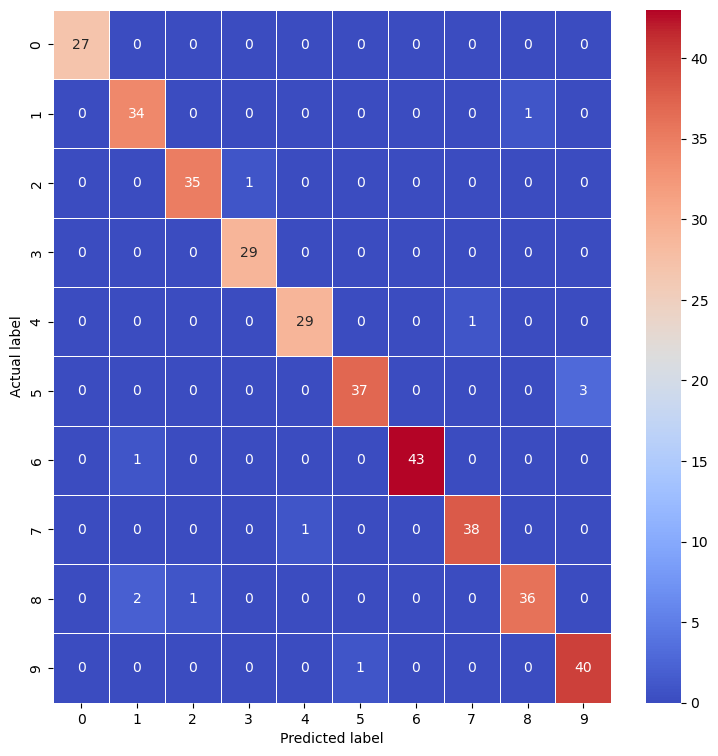

In [376]:
plt.figure(figsize=(9, 9))

sns.heatmap(cm, annot=True, linewidths=.5, cmap="coolwarm")

plt.ylabel("Actual label")
plt.xlabel("Predicted label")
plt.show()

## Regresión binomial

### Preparando [datos](https://www.kaggle.com/datasets/blastchar/telco-customer-churn)

Churn es un término de negocios para referirse a los clientes que deciden abandonar la compañía.

In [377]:
df = pd.read_csv("./data/churn.csv")
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [378]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [379]:
df.TotalCharges = pd.to_numeric(df.TotalCharges, 
                                errors="coerce")

In [380]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

##### Eliminar duplicados

In [381]:
df.drop_duplicates(inplace=True)

##### Evaluar nulos

In [382]:
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

Al ser pocos nulos a comparación del dataframe, se van a eliminar

In [383]:
df.dropna(inplace=True)
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

##### Remover columnas innecesarias

In [384]:
df.drop("customerID", axis=1, inplace=True)

##### Procesar datos categóricos

In [385]:
df.Churn.replace(["Yes", "No"], [1, 0], inplace=True)

Obtener dummies

In [386]:
df_original = df.copy()

In [387]:
df = pd.get_dummies(df, drop_first=True)

##### Viendo correlación

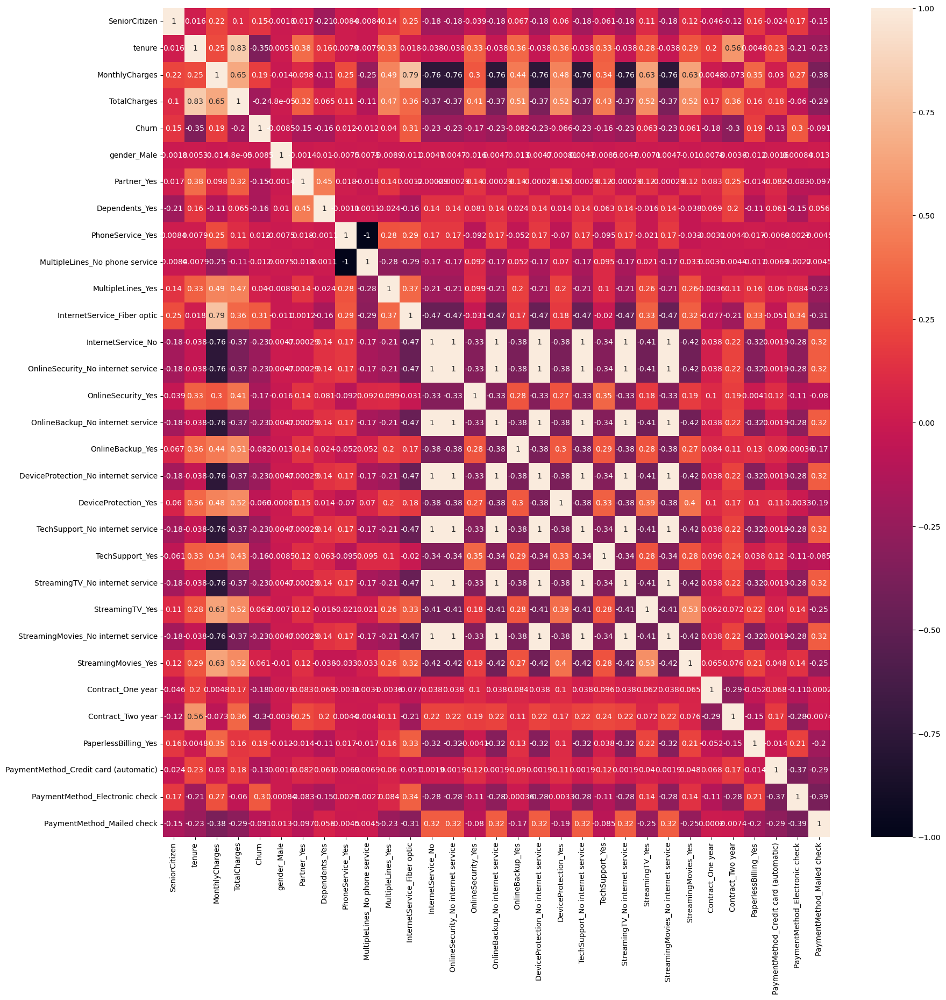

In [388]:
plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(), annot=True)
plt.show()

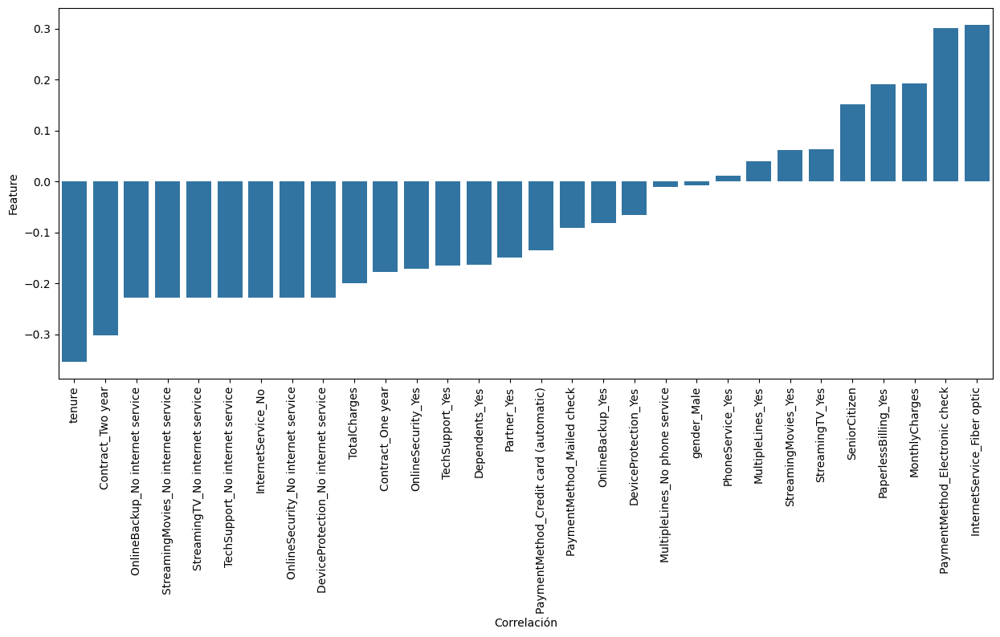

In [389]:
plt.figure(figsize=(15, 6))

sns.barplot(df.corr()["Churn"].sort_values()[:-1].reset_index(),
            x="index", y="Churn")

plt.xlabel("Correlación")
plt.ylabel("Feature")
plt.xticks(rotation = 90)
plt.show()

##### Remover outliers

##### Escalar data

In [390]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

mms = MinMaxScaler()
df_mms = pd.DataFrame(mms.fit_transform(df), columns = df.columns)
df_mms.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0.0,0.000000,0.115423,0.001275,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.464789,0.385075,0.215867,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.014085,0.354229,0.010310,1.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,0.619718,0.239303,0.210241,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.014085,0.521891,0.015330,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [391]:
ss = StandardScaler()
df_ss = pd.DataFrame(ss.fit_transform(df), columns = df.columns)
df_ss.head()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,-0.440327,-1.280248,-1.161694,-0.994194,-0.601663,-1.009430,1.035617,-0.652305,-3.056334,3.056334,...,-0.52513,-0.790186,-0.52513,-0.796849,-0.514537,-0.561364,0.828939,-0.525351,1.404764,-0.543604
1,-0.440327,0.064303,-0.260878,-0.173740,-0.601663,0.990658,-0.965608,-0.652305,0.327189,-0.327189,...,-0.52513,-0.790186,-0.52513,-0.796849,1.943495,-0.561364,-1.206361,-0.525351,-0.711863,1.839576
2,-0.440327,-1.239504,-0.363923,-0.959649,1.662059,0.990658,-0.965608,-0.652305,0.327189,-0.327189,...,-0.52513,-0.790186,-0.52513,-0.796849,-0.514537,-0.561364,0.828939,-0.525351,-0.711863,1.839576
3,-0.440327,0.512486,-0.747850,-0.195248,-0.601663,0.990658,-0.965608,-0.652305,-3.056334,3.056334,...,-0.52513,-0.790186,-0.52513,-0.796849,1.943495,-0.561364,-1.206361,-0.525351,-0.711863,-0.543604
4,-0.440327,-1.239504,0.196178,-0.940457,1.662059,-1.009430,-0.965608,-0.652305,0.327189,-0.327189,...,-0.52513,-0.790186,-0.52513,-0.796849,-0.514537,-0.561364,0.828939,-0.525351,1.404764,-0.543604


### Análisis exploratorio

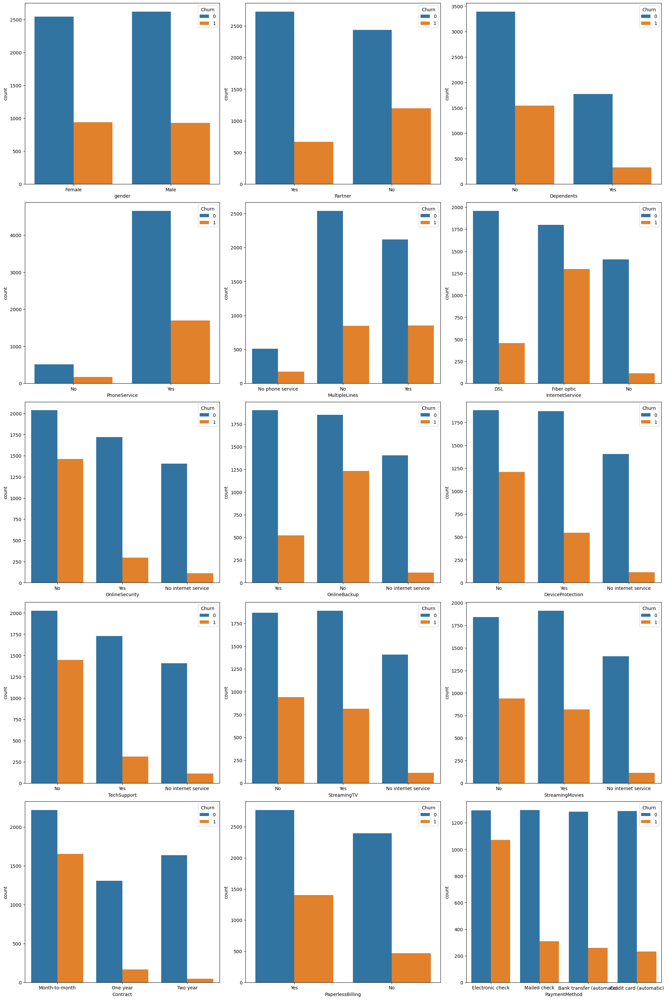

In [392]:
columns_cat = df_original.select_dtypes(include='object').columns

# Crear la figura y los subplots
fig, axs = plt.subplots(5, 3, figsize=(20,30), constrained_layout=True)

for var, ax in zip(columns_cat, axs.flatten()):
    sns.countplot(data=df_original, x=var,hue='Churn', ax=ax)

<Figure size 2000x2000 with 0 Axes>

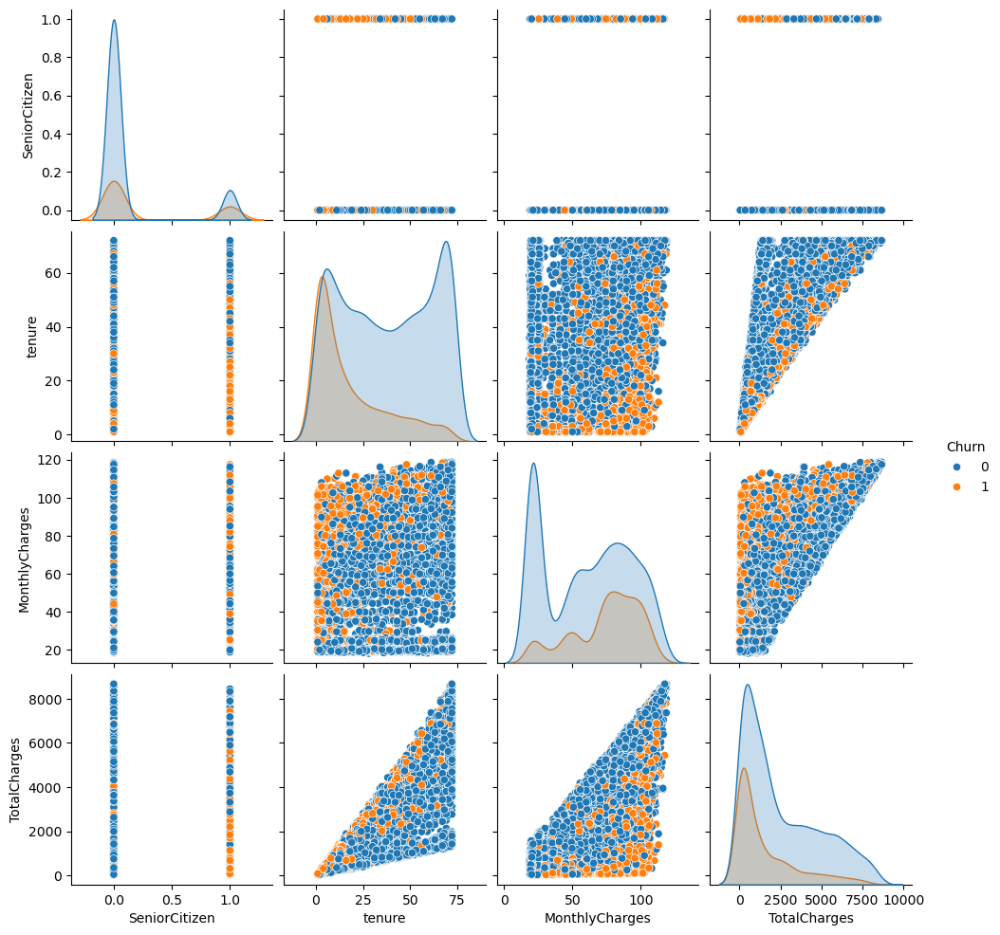

In [393]:
plt.figure(figsize=(20, 20))
sns.pairplot(df_original, hue="Churn")
plt.show()

### Entrenando el modelo

In [394]:
X = df_mms.drop("Churn", axis=1)
y = df_mms["Churn"].values

In [395]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [396]:
model = LogisticRegression()
result = model.fit(X_train, y_train)

### Evaluando el modelo

In [397]:
y_pred = model.predict(X_test)
y_pred

array([0., 0., 1., ..., 0., 0., 0.])

In [398]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test, y_pred)

0.795734597156398

In [399]:
model.predict_proba(X_test) # Probabilidad o confianza de cada resultado

array([[0.9900733 , 0.0099267 ],
       [0.86260748, 0.13739252],
       [0.30246025, 0.69753975],
       ...,
       [0.99015604, 0.00984396],
       [0.70085651, 0.29914349],
       [0.82812473, 0.17187527]])

In [400]:
model.coef_ # Peso de cada feature

array([[ 0.22035058, -3.12507861, -0.10677561,  1.20430842, -0.0231496 ,
         0.1211656 , -0.25563979, -0.22952716,  0.21292584,  0.21033512,
         0.91161368, -0.11549255, -0.11549255, -0.38784332, -0.11549255,
        -0.07610719, -0.11549255, -0.02221961, -0.11549255, -0.35122839,
        -0.11549255,  0.258926  , -0.11549255,  0.26175833, -0.82099263,
        -1.37880107,  0.20788667, -0.15752054,  0.21943162, -0.07633099]])

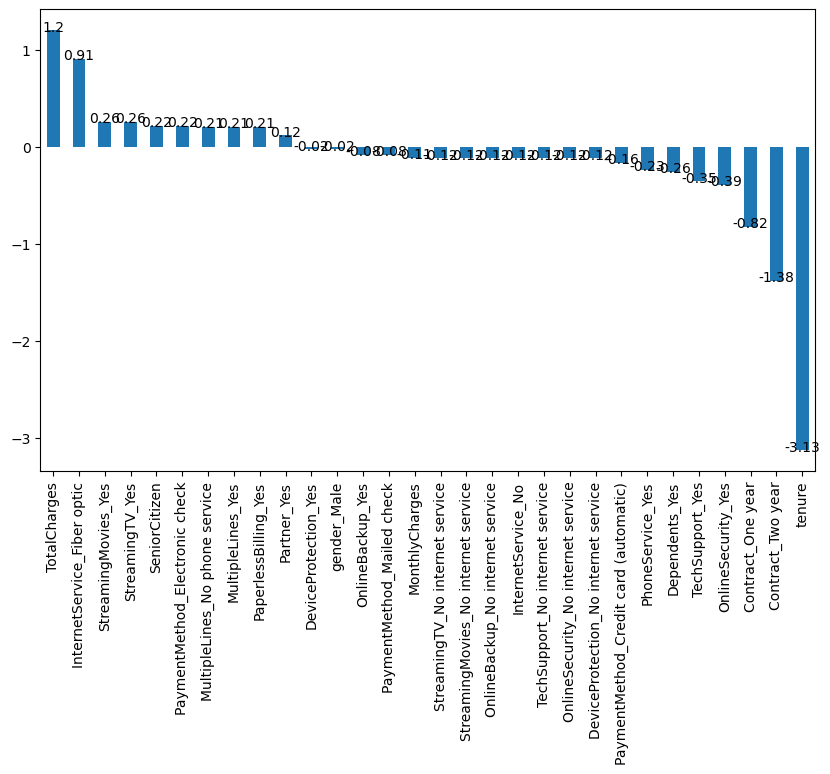

In [401]:
plt.figure(figsize=(10, 6))
weights = pd.Series(model.coef_[0],
                   index=X.columns.values)
sorted_weights = weights.sort_values(ascending=False)
sorted_weights.plot(kind="bar")

# Añadir etiquetas de los valores de Y (alturas de las barras)
for i, value in enumerate(sorted_weights):
    plt.annotate(round(value, 2), 
                 (i, value), 
                 textcoords="offset points",
                 xytext=(0,-0.5),
                 ha='center')

plt.show()

In [402]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report

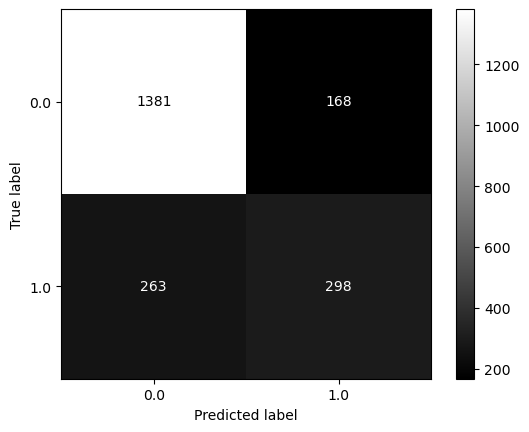

In [403]:
cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
cm_display = ConfusionMatrixDisplay(cm, display_labels=model.classes_)

cm_display.plot(cmap="gray")
plt.show()

In [404]:
first_report = classification_report(y_test, y_pred)
print(first_report)

              precision    recall  f1-score   support

         0.0       0.84      0.89      0.87      1549
         1.0       0.64      0.53      0.58       561

    accuracy                           0.80      2110
   macro avg       0.74      0.71      0.72      2110
weighted avg       0.79      0.80      0.79      2110



### Balanceando datos

In [405]:
df_mms["Churn"].value_counts(normalize=True)

Churn
0.0    0.734215
1.0    0.265785
Name: proportion, dtype: float64

In [406]:
from imblearn.combine import SMOTEENN

Eliminando las variables aparentemente innecesarias

In [407]:
model.feature_names_in_

array(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges',
       'gender_Male', 'Partner_Yes', 'Dependents_Yes', 'PhoneService_Yes',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No internet service', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year', 'PaperlessBilling_Yes',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype=object)

In [408]:
np.abs(model.coef_[0]).round(3)

array([0.22 , 3.125, 0.107, 1.204, 0.023, 0.121, 0.256, 0.23 , 0.213,
       0.21 , 0.912, 0.115, 0.115, 0.388, 0.115, 0.076, 0.115, 0.022,
       0.115, 0.351, 0.115, 0.259, 0.115, 0.262, 0.821, 1.379, 0.208,
       0.158, 0.219, 0.076])

In [409]:
grades = 0.25
features = model.feature_names_in_[np.abs(model.coef_[0]) >= grades]
features

array(['tenure', 'TotalCharges', 'Dependents_Yes',
       'InternetService_Fiber optic', 'OnlineSecurity_Yes',
       'TechSupport_Yes', 'StreamingTV_Yes', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year'], dtype=object)

In [410]:
X = df_mms[features]
y = df_mms["Churn"].values

In [411]:
imp = SMOTEENN(sampling_strategy=0.99, random_state=42)

X_bal, y_bal = imp.fit_resample(X, y)

#### Evaluando el modelo

In [412]:
# Antiguas métricas
print(first_report)

              precision    recall  f1-score   support

         0.0       0.84      0.89      0.87      1549
         1.0       0.64      0.53      0.58       561

    accuracy                           0.80      2110
   macro avg       0.74      0.71      0.72      2110
weighted avg       0.79      0.80      0.79      2110



In [413]:
X_train, X_test, y_train, y_test = train_test_split(X_bal, y_bal, 
                                test_size=0.3, random_state=42)

new_model = LogisticRegression()
result = new_model.fit(X_train, y_train)
y_pred = new_model.predict(X_test)

new_report = classification_report(y_test, y_pred)

print(new_report)

              precision    recall  f1-score   support

         0.0       0.93      0.89      0.91       912
         1.0       0.88      0.92      0.90       829

    accuracy                           0.91      1741
   macro avg       0.91      0.91      0.91      1741
weighted avg       0.91      0.91      0.91      1741



## Regresión multinomial

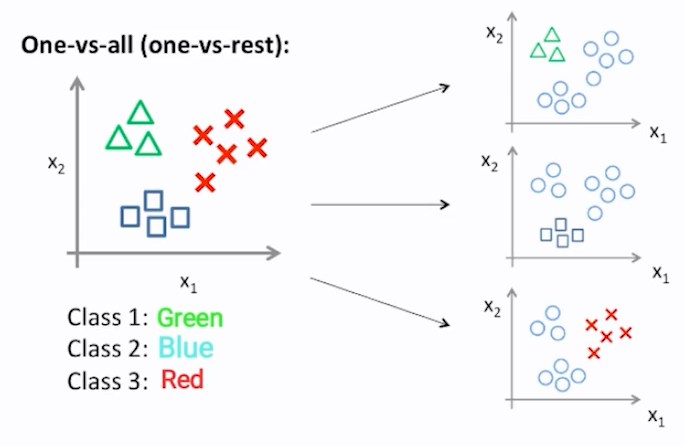

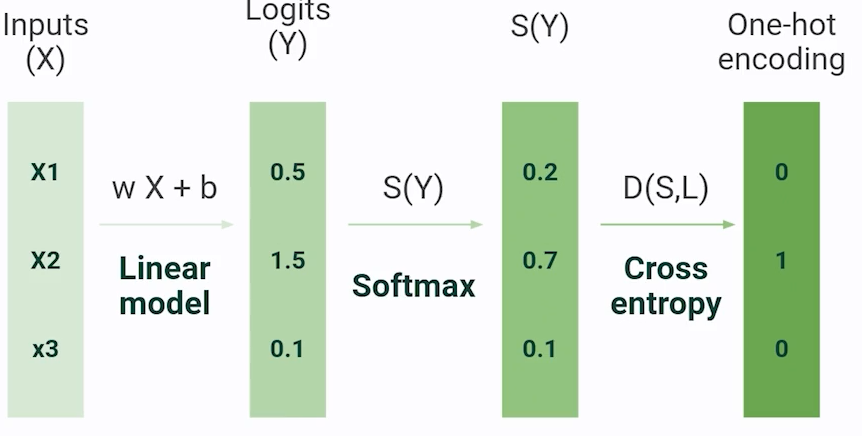

### Carga y preproscesamiento de [datos](https://www.kaggle.com/datasets/sansuthi/dry-bean-dataset)

In [414]:
df = pd.read_csv("./data/Dry_Bean.csv")
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [415]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [416]:
df.drop_duplicates(inplace=True)

In [417]:
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

#### Undersampling

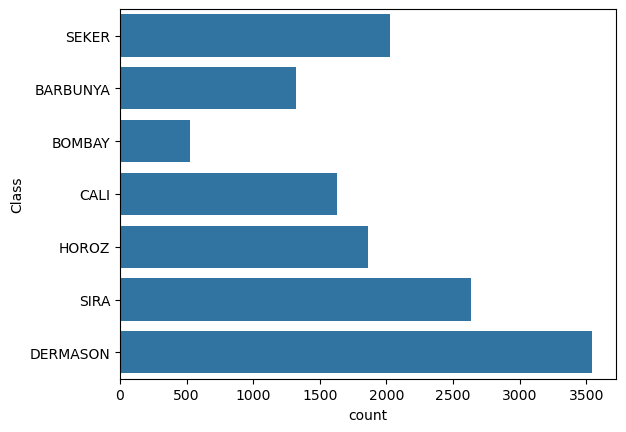

In [418]:
sns.countplot(df.Class)
plt.show()

In [419]:
from imblearn.under_sampling import RandomUnderSampler

In [420]:
undersample = RandomUnderSampler(random_state=42)

X = df.drop("Class", axis=1)
y = df["Class"]

X_over, y_over = undersample.fit_resample(X, y)

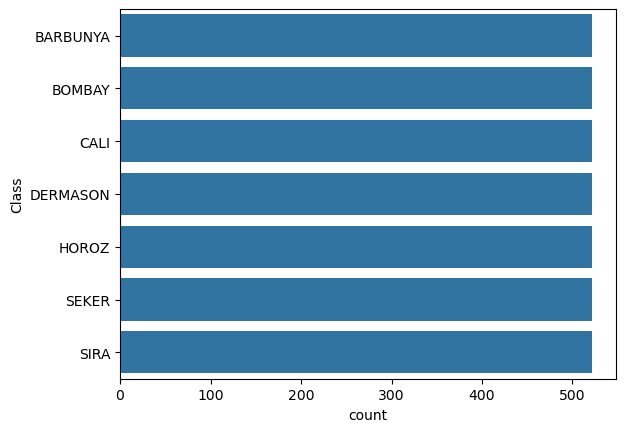

In [421]:
sns.countplot(y_over)
plt.show()

In [422]:
df.shape

(13543, 17)

In [423]:
X_over.shape

(3654, 16)

In [424]:
y_over.replace(list(np.unique(y_over)),
               list(range(1, len(np.unique(y_over)) + 1)),
               inplace=True)

### Analisis exploratorio

In [425]:
df_dea = pd.concat([X_over, y_over], axis=1)
df_dea.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
2754,70776,1060.894,386.619944,234.100208,1.651515,0.795842,71978,300.191276,0.775763,0.983300,0.790227,0.776451,0.005463,0.001225,0.602875,0.995658,1
2506,66370,1004.139,339.287072,249.883085,1.357783,0.676443,67637,290.697280,0.720536,0.981268,0.827169,0.856789,0.005112,0.001699,0.734087,0.996731,1
2267,60736,985.501,342.445302,226.741775,1.510288,0.749393,61680,278.085377,0.789353,0.984695,0.785854,0.812058,0.005638,0.001512,0.659438,0.995941,1
2449,65219,1011.110,353.650546,235.308999,1.502920,0.746512,66672,288.165594,0.719436,0.978207,0.801654,0.814831,0.005423,0.001475,0.663950,0.997864,1
2076,51332,889.637,330.822804,198.618899,1.665616,0.799716,52283,255.651975,0.751688,0.981811,0.815028,0.772776,0.006445,0.001418,0.597183,0.994678,1


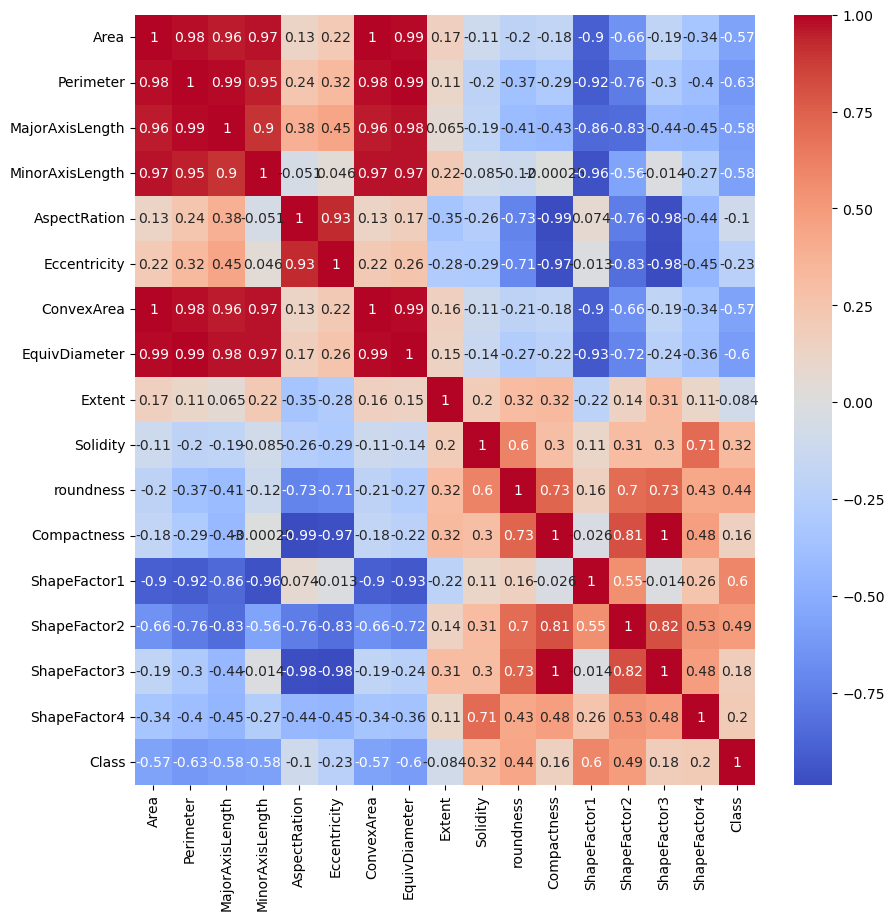

In [426]:
plt.figure(figsize=(10, 10))
sns.heatmap(df_dea.corr(), annot=True, cmap="coolwarm")
plt.show()

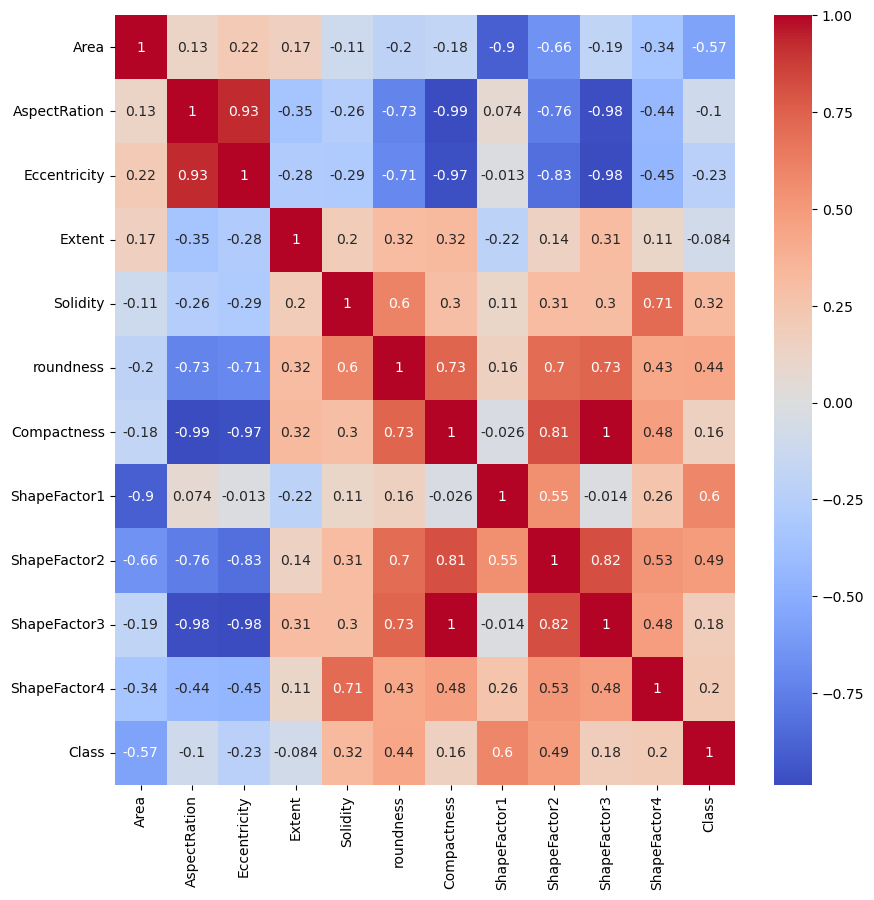

In [427]:
plt.figure(figsize=(10, 10))
sns.heatmap(df_dea.drop(["ConvexArea", "EquivDiameter", "Perimeter", "MajorAxisLength", "MinorAxisLength"], axis=1).corr(),
            annot=True, cmap="coolwarm")
plt.show()

In [428]:
X_over.drop(["ConvexArea", "EquivDiameter"], axis=1, inplace=True)

#### Visualización

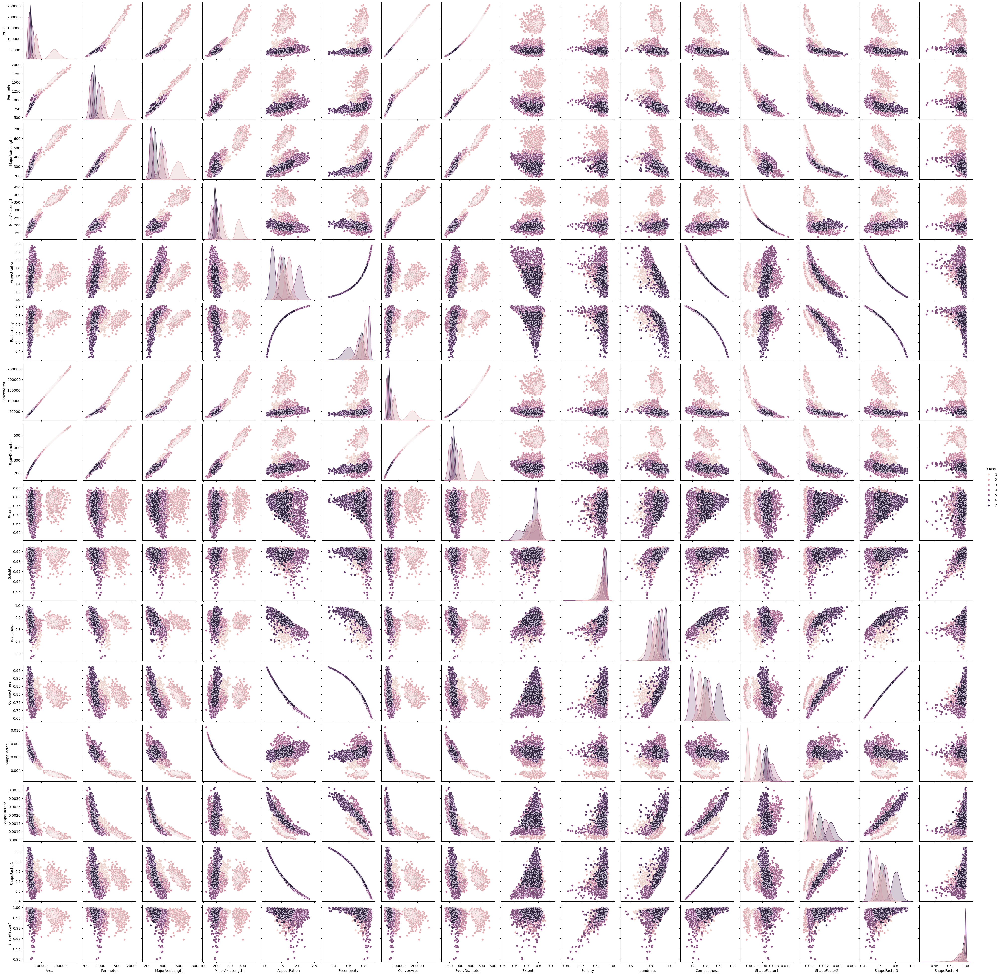

In [429]:
sns.pairplot(df_dea, hue="Class")
plt.show()

### Split de los datos

In [430]:
X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, random_state=42,
                                                    shuffle=True, test_size=.2)

#### Estandarizar los datos

In [431]:
sc_x = StandardScaler()
X_train = sc_x.fit_transform(X_train)
X_test = sc_x.transform(X_test)

### Modelado

In [432]:
def logistic_model(C_, solver_, multiclass_):
    return LogisticRegression(random_state=42, solver=solver_, 
                              multi_class=multiclass_,
                              n_jobs=-1, C=C_)

In [433]:
model = logistic_model(1, "saga", "multinomial")
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(accuracy_score(y_pred, y_test))
confusion_matrix(y_test, y_pred)

0.9247606019151847


array([[119,   0,   5,   0,   1,   0,   3],
       [  0,  98,   0,   0,   0,   0,   0],
       [  5,   0,  97,   0,   0,   0,   1],
       [  0,   0,   0,  90,   0,   5,  10],
       [  0,   0,   4,   1,  91,   0,   0],
       [  3,   0,   0,   0,   0,  84,   4],
       [  0,   0,   1,   6,   6,   0,  97]], dtype=int64)

#### Optimizando hiperparámetros

In [434]:
multiclasses = ["ovr", "multinomial"]
solvers = ["liblinear", "newton-cg", "lbfgs", "sag", "saga"]

models = pd.DataFrame(columns=["Params", "Scores"])

for multiclass in multiclasses:
    for solver in solvers:
        try:
            model = logistic_model(1, solver, multiclass)
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            
            
            row = pd.DataFrame({"Params": [f"{multiclass} - {solver}"], "Scores": [accuracy_score(y_test, y_pred)]})
            models = pd.concat([models, row])
        except:
            pass

In [435]:
models.sort_values(by="Scores", ascending=False)

,Params,Scores
0,multinomial - newton-cg,0.924761
0,multinomial - lbfgs,0.924761
0,multinomial - sag,0.924761
0,multinomial - saga,0.924761
0,ovr - newton-cg,0.919289
0,ovr - lbfgs,0.919289
0,ovr - sag,0.919289
0,ovr - liblinear,0.917921
0,ovr - saga,0.917921


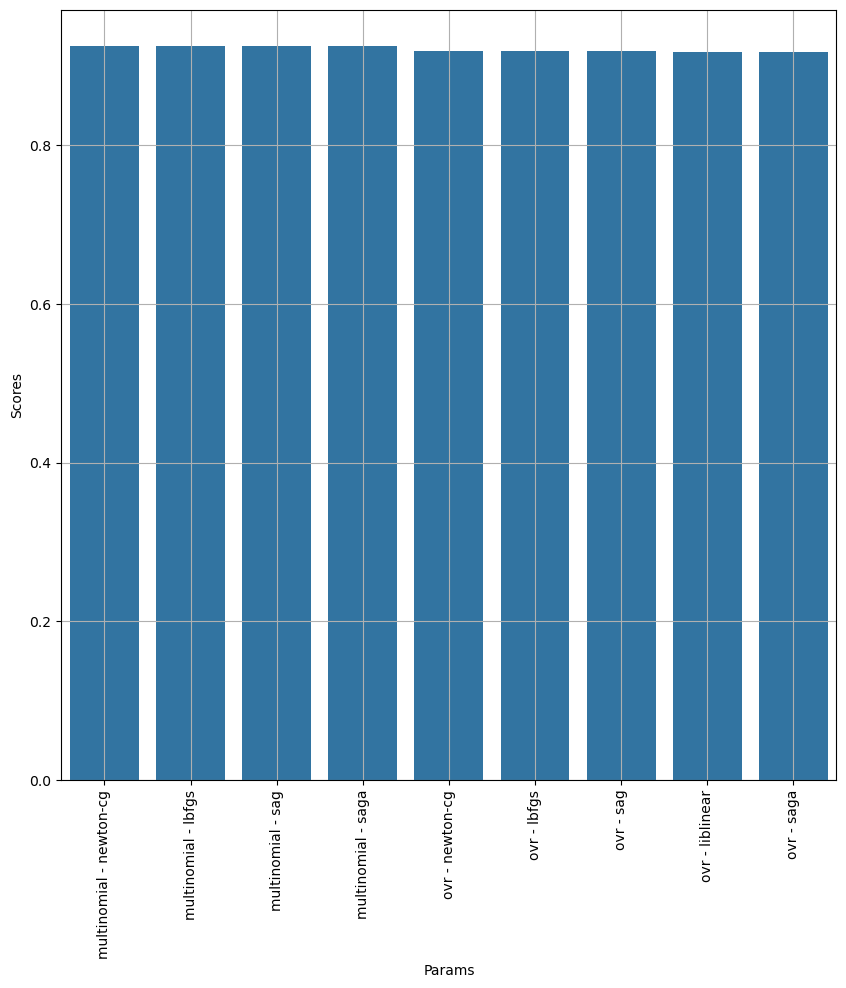

In [436]:
plt.figure(figsize=(10, 10))
sns.barplot(models.sort_values(by="Scores", ascending=False), x="Params", y="Scores")
plt.xticks(rotation=90)
plt.grid()

##### Automáticamente

In [437]:
from sklearn.model_selection import GridSearchCV

In [438]:
parameters = {
    "solver": solvers,
    "multi_class": multiclasses
}

log_reg = LogisticRegression()

clf = GridSearchCV(log_reg,
                   param_grid=parameters,
                   scoring="accuracy",
                   cv=10)

clf.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag',
                                    'saga']},
             scoring='accuracy')

In [441]:
clf.best_estimator_

LogisticRegression(multi_class='multinomial', solver='newton-cg')

In [439]:
y_pred = clf.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))

[[119   0   5   0   1   0   3]
 [  0  98   0   0   0   0   0]
 [  5   0  97   0   0   0   1]
 [  0   0   0  90   0   5  10]
 [  0   0   4   1  91   0   0]
 [  3   0   0   0   0  84   4]
 [  0   0   1   6   6   0  97]]
0.9247606019151847


### Verificando overfitting

In [443]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

kfold = KFold(n_splits=5)

results = cross_val_score(clf, X_test, y_test, cv=kfold)
print(results.mean()) # El resultado debe ser similar a nuestro accuracy

0.9247786785947255
